## Credit Card Fraud Detection

The primary objective of credit card fraud detection is to identify and prevent unauthorized transactions on credit card accounts to minimize financial losses for both customers and financial institutions.

There are some key goals for fraud detection :
* Protecting Customer Assets
* Minimizing Financial Losses
* Reducing Chargebacks
* Improving Customer Trust and Confidence
* Enhancing Operational Efficiency
* Analyzing Fraud Patterns and Trends

There are some primary challeneges involved in credit card fraud detection  like
* Large amount of data is processed every day and the model build must be fast enough to respond to the scam in time.
* Imbalanced Data i.e most of the transactions (99.8%) are not fraudulent which makes it really hard for detecting the fraudulent ones.
* Data availability as the data is mostly private.
* Misclassified Data can be another major issue, as not every fraudulent transaction is caught and reported.

In [1]:
!pip uninstall -y scikit-learn imbalanced-learn


Found existing installation: scikit-learn 1.3.0
Uninstalling scikit-learn-1.3.0:
  Successfully uninstalled scikit-learn-1.3.0
Found existing installation: imbalanced-learn 0.11.0
Uninstalling imbalanced-learn-0.11.0:
  Successfully uninstalled imbalanced-learn-0.11.0


In [2]:
!pip install scikit-learn==1.3.0 imbalanced-learn==0.11.0


  Using cached scikit_learn-1.3.0-cp311-cp311-win_amd64.whl (9.2 MB)
  Using cached imbalanced_learn-0.11.0-py3-none-any.whl (235 kB)


In [3]:
from platform import python_version
print(python_version())

3.11.3


In [4]:
import sklearn
print(sklearn.__version__)

1.3.0


In [5]:
!pip install --upgrade scikit-learn --user


                                              0.0/8.9 MB ? eta -:--:--
                                              0.0/8.9 MB ? eta -:--:--
                                              0.0/8.9 MB ? eta -:--:--
                                              0.0/8.9 MB ? eta -:--:--
                                              0.0/8.9 MB ? eta -:--:--
                                              0.0/8.9 MB ? eta -:--:--
                                              0.0/8.9 MB ? eta -:--:--
                                              0.0/8.9 MB ? eta -:--:--
                                              0.0/8.9 MB 217.9 kB/s eta 0:00:41
                                              0.0/8.9 MB 217.9 kB/s eta 0:00:41
                                              0.0/8.9 MB 217.9 kB/s eta 0:00:41
                                              0.0/8.9 MB 217.9 kB/s eta 0:00:41
                                              0.0/8.9 MB 217.9 kB/s eta 0:00:41
                                

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sklearn-compat 0.1.3 requires scikit-learn<1.7,>=1.2, but you have scikit-learn 1.7.2 which is incompatible.


In [6]:
import sklearn
print(sklearn.__version__)

1.3.0


In [7]:
!pip install imbalanced-learn==0.11.0


In [8]:
#Importing Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import gridspec

C:\Anaconda\Lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [9]:
df=pd.read_csv(r"C:\Users\satyaki basak\Downloads\creditcard.csv\creditcard.csv")

In [10]:
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [11]:
df.tail()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
284802,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.77,0
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.79,0
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.88,0
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.00,0
284806,172792.0,-0.533413,-0.189733,0.703337,-0.506271,-0.012546,-0.649617,1.577006,-0.414650,0.486180,...,0.261057,0.643078,0.376777,0.008797,-0.473649,-0.818267,-0.002415,0.013649,217.00,0


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

* There is no null values. So we don't need to handle missing value.

* Their are 31 columns in dataset in which features V1, V2, … V28 are the principal components obtained with PCA, the only features which have not been transformed with PCA are ‘Time’ and ‘Amount’. Their is a column named class in whose value is 0 if transaction is legitimate(not fraud) and 1 if it is fraud.

In [13]:
df.shape

(284807, 31)

In [14]:
#Distribution of Genuine and fraudelent transactions
df['Class'].value_counts()

Class
0    284315
1       492
Name: count, dtype: int64

0    0.000000
1    0.000000
2    0.000278
3    0.000278
4    0.000556
Name: Time_Hr, dtype: float64


Text(0, 0.5, 'Transactions')

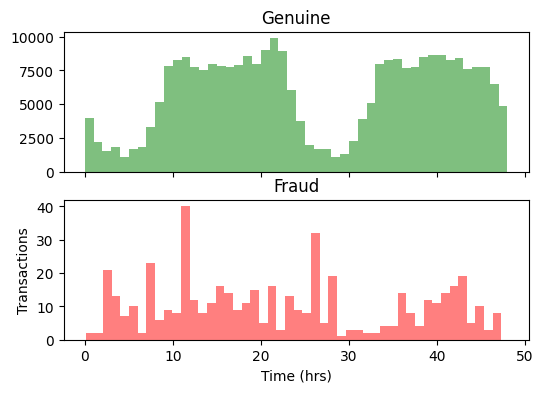

In [15]:
#plot the graph showing the similarity of legitimate transaction and fraud transaction with respect to time variable

df["Time_Hr"] = df["Time"]/3600 # convert to hours
print(df["Time_Hr"].head(5))
fig, (ax1, ax2) = plt.subplots(2, 1, sharex = True, figsize=(6,4))
ax1.hist(df.Time_Hr[df.Class==0],bins=48,color='g',alpha=0.5)
ax1.set_title('Genuine')
ax2.hist(df.Time_Hr[df.Class==1],bins=48,color='r',alpha=0.5)
ax2.set_title('Fraud')
plt.xlabel('Time (hrs)')
plt.ylabel('Transactions')

Text(0, 0.5, '# transactions')

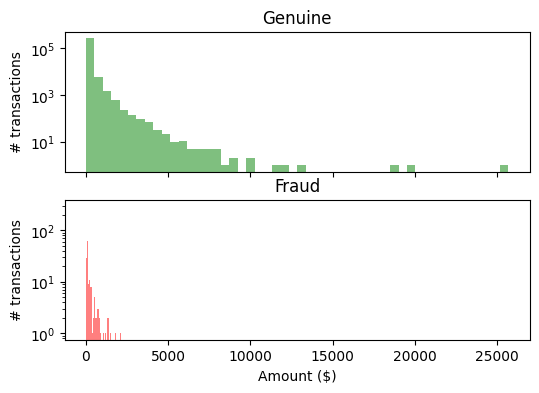

In [16]:
fig, (ax3,ax4) = plt.subplots(2,1, figsize = (6,4), sharex = True)
ax3.hist(df.Amount[df.Class==0],bins=50,color='g',alpha=0.5)
ax3.set_yscale('log') # to see the tails
ax3.set_title('Genuine')
ax3.set_ylabel('# transactions')
ax4.hist(df.Amount[df.Class==1],bins=50,color='r',alpha=0.5)
ax4.set_yscale('log') # to see the tails
ax4.set_title('Fraud')
ax4.set_xlabel('Amount ($)')
ax4.set_ylabel('# transactions')

* We can clearly see a vast difference in the both graphs i.e Genuine and Fraud. Also the main point is that in genuine(Legitimate transaction) the transactions of more than 10k are done but in fraud cases no transactions are more than 10k

In [17]:
#Separting genuine and fraud data for analysis 
genuine=df[df.Class==0]
fraud=df[df.Class==1]

In [18]:
genuine.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V22,V23,V24,V25,V26,V27,V28,Amount,Class,Time_Hr
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0,0.000000
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0,0.000000
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0,0.000278
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0,0.000278
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0,0.000556


In [19]:
fraud.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V22,V23,V24,V25,V26,V27,V28,Amount,Class,Time_Hr
541,406.0,-2.312227,1.951992,-1.609851,3.997906,-0.522188,-1.426545,-2.537387,1.391657,-2.770089,...,-0.035049,-0.465211,0.320198,0.044519,0.177840,0.261145,-0.143276,0.00,1,0.112778
623,472.0,-3.043541,-3.157307,1.088463,2.288644,1.359805,-1.064823,0.325574,-0.067794,-0.270953,...,0.435477,1.375966,-0.293803,0.279798,-0.145362,-0.252773,0.035764,529.00,1,0.131111
4920,4462.0,-2.303350,1.759247,-0.359745,2.330243,-0.821628,-0.075788,0.562320,-0.399147,-0.238253,...,-0.932391,0.172726,-0.087330,-0.156114,-0.542628,0.039566,-0.153029,239.93,1,1.239444
6108,6986.0,-4.397974,1.358367,-2.592844,2.679787,-1.128131,-1.706536,-3.496197,-0.248778,-0.247768,...,0.176968,-0.436207,-0.053502,0.252405,-0.657488,-0.827136,0.849573,59.00,1,1.940556
6329,7519.0,1.234235,3.019740,-4.304597,4.732795,3.624201,-1.357746,1.713445,-0.496358,-1.282858,...,-0.704181,-0.656805,-1.632653,1.488901,0.566797,-0.010016,0.146793,1.00,1,2.088611


In [20]:
print(genuine.shape)
print(fraud.shape)

(284315, 32)
(492, 32)


In [21]:
#statistical measure on amount col
genuine.Amount.describe()

count    284315.000000
mean         88.291022
std         250.105092
min           0.000000
25%           5.650000
50%          22.000000
75%          77.050000
max       25691.160000
Name: Amount, dtype: float64

In [22]:
fraud.Amount.describe()

count     492.000000
mean      122.211321
std       256.683288
min         0.000000
25%         1.000000
50%         9.250000
75%       105.890000
max      2125.870000
Name: Amount, dtype: float64

In [23]:
outlierFraction = len(fraud)/float(len(genuine))
print(outlierFraction)

0.0017304750013189597


* Only 0.17% fraudulent transaction out all the transactions. The data is highly Unbalanced

In [24]:
#comparing values for both transaction
df.groupby('Class').mean()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Time_Hr
Class,,,,,,,,,,,,,,,,,,,,,
0,94838.202258,0.008258,-0.006271,0.012171,-0.007860,0.005453,0.002419,0.009637,-0.000987,0.004467,...,-0.001235,-0.000024,0.000070,0.000182,-0.000072,-0.000089,-0.000295,-0.000131,88.291022,26.343945
1,80746.806911,-4.771948,3.623778,-7.033281,4.542029,-3.151225,-1.397737,-5.568731,0.570636,-2.581123,...,0.713588,0.014049,-0.040308,-0.105130,0.041449,0.051648,0.170575,0.075667,122.211321,22.429669


In [25]:
print(df['Amount'].max())
print(df['Amount'].min())

25691.16
0.0


* By seeing data values of feature Amount lies in range of 0 to 25691.16 which is obviously very wide range. So we need to scale its value between (-1,1) by applying Standardization technique

In [26]:
from sklearn.preprocessing import StandardScaler
df['scaled_Amount'] = StandardScaler().fit_transform(df['Amount'].values.reshape(-1,1))
df = df.drop(['Amount'],axis=1)

In [27]:
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V22,V23,V24,V25,V26,V27,V28,Class,Time_Hr,scaled_Amount
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,0,0.000000,0.244964
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,0,0.000000,-0.342475
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,0,0.000278,1.160686
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,0,0.000278,0.140534
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,0,0.000556,-0.073403


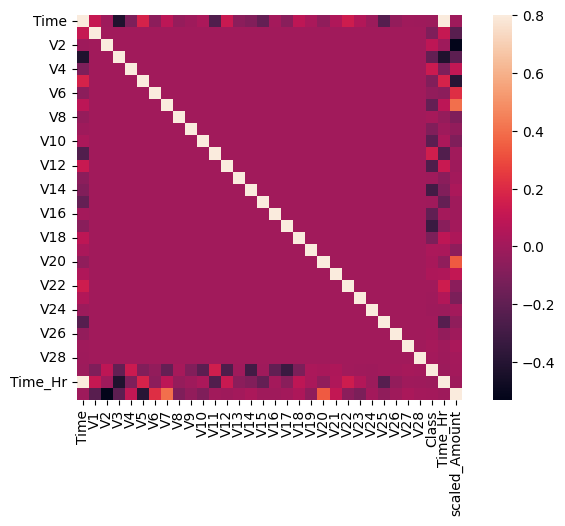

In [28]:
#Plotting the Correlation Matrix
corrmat = df.corr()
fig = plt.figure(figsize = (8, 5))
sns.heatmap(corrmat, vmax = .8, square = True)
plt.show()

* In the HeatMap we can clearly see that most of the features do not correlate to other features but there are some features that either has a positive or a negative correlation with each other. For example, V2 and V5 are highly negatively correlated with the feature called Amount.

### Using Logistic regression and Random Forest Classifier for Imbalanced Dataset

In [29]:
x=df.drop("Class",axis=1)
y=df.Class

In [30]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV

In [31]:
logr=LogisticRegression()
grid={'C':10.0**np.arange(-2,3),'penalty':['l1','l2']}
cv=KFold(n_splits=5,shuffle=False)

In [32]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,train_size=0.7)

In [33]:
clf=GridSearchCV(logr,grid,cv=cv,n_jobs=-1,scoring='f1_macro')
clf.fit(x_train,y_train)

C:\Anaconda\Lib\site-packages\sklearn\model_selection\_validation.py:425: FitFailedWarning: 
25 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
25 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Anaconda\Lib\site-packages\sklearn\model_selection\_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Anaconda\Lib\site-packages\sklearn\base.py", line 1151, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Anaconda\Lib\site-packages\sklearn\linear_model\_logistic.py", line 1168, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
 

GridSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=False),
             estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': array([1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02]),
                         'penalty': ['l1', 'l2']},
             scoring='f1_macro')

In [34]:
y_pred=clf.predict(x_test)

In [35]:
print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[85262    37]
 [   48    96]]
0.9990051847430451
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85299
           1       0.72      0.67      0.69       144

    accuracy                           1.00     85443
   macro avg       0.86      0.83      0.85     85443
weighted avg       1.00      1.00      1.00     85443



In [36]:
from sklearn.ensemble import RandomForestClassifier
clf1=RandomForestClassifier()
clf1.fit(x_train,y_train)

RandomForestClassifier()

In [37]:
y_pred=clf1.predict(x_test)
print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[85288    11]
 [   40   104]]
0.999403110845827
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85299
           1       0.90      0.72      0.80       144

    accuracy                           1.00     85443
   macro avg       0.95      0.86      0.90     85443
weighted avg       1.00      1.00      1.00     85443



In [38]:
class_weight=dict({0:1,1:100})

#### here we have assigned some weights on the labels to capture the importance of that class in the whole dataset

In [39]:
clf2=RandomForestClassifier(class_weight=class_weight)
clf2.fit(x_train,y_train)

RandomForestClassifier(class_weight={0: 1, 1: 100})

In [40]:
y_pred=clf2.predict(x_test)
print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[85289    10]
 [   41   103]]
0.999403110845827
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85299
           1       0.91      0.72      0.80       144

    accuracy                           1.00     85443
   macro avg       0.96      0.86      0.90     85443
weighted avg       1.00      1.00      1.00     85443



In [41]:
from collections import Counter
Counter(y_train)

Counter({0: 199016, 1: 348})

#### under-sampling

In [42]:
from collections import Counter
from imblearn.under_sampling import NearMiss
ns=NearMiss(sampling_strategy=0.8)
x_train_ns,y_train_ns=ns.fit_resample(x_train,y_train)
print("The number of classes before fit {}".format(Counter(y_train)))
print("The number of classes after fit {}".format(Counter(y_train_ns)))

The number of classes before fit Counter({0: 199016, 1: 348})
The number of classes after fit Counter({0: 435, 1: 348})


In [43]:
from sklearn.ensemble import RandomForestClassifier
classifier=RandomForestClassifier()
classifier.fit(x_train_ns,y_train_ns)

RandomForestClassifier()

In [44]:
y_pred=classifier.predict(x_test)
print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[80639  4660]
 [   21   123]]
0.9452149386140468
              precision    recall  f1-score   support

           0       1.00      0.95      0.97     85299
           1       0.03      0.85      0.05       144

    accuracy                           0.95     85443
   macro avg       0.51      0.90      0.51     85443
weighted avg       1.00      0.95      0.97     85443



here we can see that using under sampling precison reduced to very small number which is not acceptable. For such huge imbalance dataset we shouldn't use undersampling techniques.

#### Oversampling

In [45]:
from imblearn.over_sampling import RandomOverSampler

In [46]:
os=RandomOverSampler(sampling_strategy=0.75)
x_train_ns,y_train_ns=os.fit_resample(x_train,y_train)
print("The number of classes before fit {}".format(Counter(y_train)))
print("The number of classes after fit {}".format(Counter(y_train_ns)))

The number of classes before fit Counter({0: 199016, 1: 348})
The number of classes after fit Counter({0: 199016, 1: 149262})


In [47]:
from sklearn.ensemble import RandomForestClassifier
classifier=RandomForestClassifier()
classifier.fit(x_train_ns,y_train_ns)

RandomForestClassifier()

In [48]:
y_pred=classifier.predict(x_test)
print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[85287    12]
 [   37   107]]
0.9994265182636377
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85299
           1       0.90      0.74      0.81       144

    accuracy                           1.00     85443
   macro avg       0.95      0.87      0.91     85443
weighted avg       1.00      1.00      1.00     85443



#### SMOTETomek

In [49]:
from imblearn.combine import SMOTETomek

In [50]:
os=SMOTETomek(sampling_strategy=0.75)
x_train_ns,y_train_ns=os.fit_resample(x_train,y_train)
print("The number of classes before fit {}".format(Counter(y_train)))
print("The number of classes after fit {}".format(Counter(y_train_ns)))

The number of classes before fit Counter({0: 199016, 1: 348})
The number of classes after fit Counter({0: 198822, 1: 149068})


In [51]:
from sklearn.ensemble import RandomForestClassifier
classifier=RandomForestClassifier()
classifier.fit(x_train_ns,y_train_ns)

RandomForestClassifier()

In [52]:
y_pred=classifier.predict(x_test)
print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[85281    18]
 [   34   110]]
0.9993914071369217
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85299
           1       0.86      0.76      0.81       144

    accuracy                           1.00     85443
   macro avg       0.93      0.88      0.90     85443
weighted avg       1.00      1.00      1.00     85443



In [53]:
!pip install xgboost


In [54]:
import xgboost as xgb
modelx = xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss')
modelx.fit(x_train_ns, y_train_ns)


C:\Anaconda\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:25:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, random_state=None, ...)

In [55]:
y_pred=modelx.predict(x_test)
print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[85273    26]
 [   33   111]]
0.9993094811745842
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85299
           1       0.81      0.77      0.79       144

    accuracy                           1.00     85443
   macro avg       0.90      0.89      0.89     85443
weighted avg       1.00      1.00      1.00     85443



#### Perfroming hyper param tuning with Xgboost

In [57]:
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 4, 5,6,8,10,12,15],
    'learning_rate': [0.05, 0.10, 0.15,0.20,0.25,0.30],
    'mean_child_weight': [1,3,5,7,8],
    'colsample_bytree': [0.3, 0.4,0.5,0.7],
    'gamma':[0.0,0.1,0.2,0.3,0.4]
}


In [58]:
from sklearn.model_selection import RandomizedSearchCV

In [59]:
rs=RandomizedSearchCV(modelx,param_distributions=param_grid,n_iter=5,scoring='roc_auc',n_jobs=-1,cv=5,verbose=3)

In [60]:
rs.fit(x_train_ns,y_train_ns)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


C:\Anaconda\Lib\site-packages\xgboost\core.py:158: UserWarning: [20:31:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "mean_child_weight", "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric='logloss',
                                           feature_types=None, gamma=None,
                                           grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning...
                                           multi_strategy=None,
                                           n_estimators=None, n_jobs=None,
                                           num_parallel_tree=None,
                                           random_state=None, ...),
                   n_iter=5, n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.3, 0.4, 0.5,
                                                             0.7],
                                        'gamma': [0.0, 0.1, 0.2, 0.3, 0.4],
                                        'learning_rate': [0.05, 0.1, 0.15, 0.2,
                                                          0.25, 0.3],
                                        'max_depth': [3, 4, 5, 6, 8, 10, 12,
                                                      15],
                                        'mean_child_weight': [1, 3, 5, 7, 8],
                                        'n_estimators': [100, 200]},
                   scoring='roc_auc', verbose=3)

In [61]:
rs.best_estimator_

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.7, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=0.1, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.25, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=8,
              max_leaves=None, mean_child_weight=5, min_child_weight=None,
              missing=nan, monotone_constraints=None, multi_strategy=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None, ...)

In [62]:
rs.best_params_

{'n_estimators': 100,
 'mean_child_weight': 5,
 'max_depth': 8,
 'learning_rate': 0.25,
 'gamma': 0.1,
 'colsample_bytree': 0.7}

In [63]:
y_pred=rs.predict(x_test)
print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))
print(classification_report(y_test,y_pred))

[[85276    23]
 [   32   112]]
0.9993562960102056
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85299
           1       0.83      0.78      0.80       144

    accuracy                           1.00     85443
   macro avg       0.91      0.89      0.90     85443
weighted avg       1.00      1.00      1.00     85443



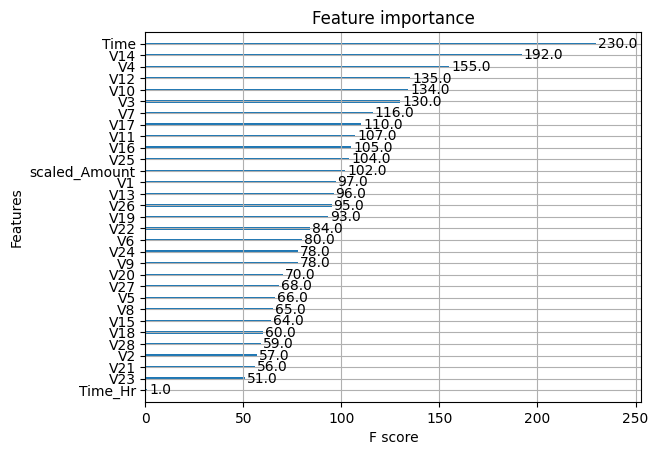

In [64]:
from xgboost import plot_importance

plot_importance(modelx, importance_type='weight') 
plt.show()


In [68]:
import plotly.express as px
import pandas as pd
import numpy as np

booster = modelx.get_booster()
importance = booster.get_score(importance_type='weight')

importance_df = pd.DataFrame({
    'Feature': list(importance.keys()),
    'Importance': list(importance.values())
})

importance_df = importance_df.sort_values(by="Importance", ascending=False)




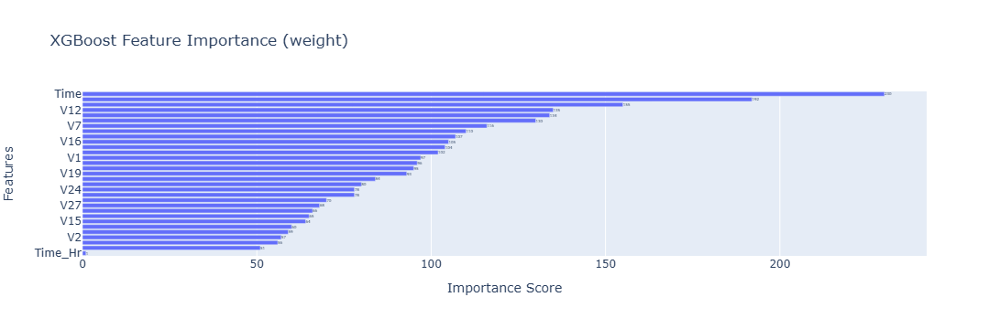

In [69]:
fig = px.bar(
    importance_df,
    x="Importance",
    y="Feature",
    orientation='h',
    title="XGBoost Feature Importance (weight)",
    labels={"Importance": "Importance Score", "Feature": "Features"},
    text="Importance"
)

fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(yaxis=dict(categoryorder='total ascending'))
fig.show()


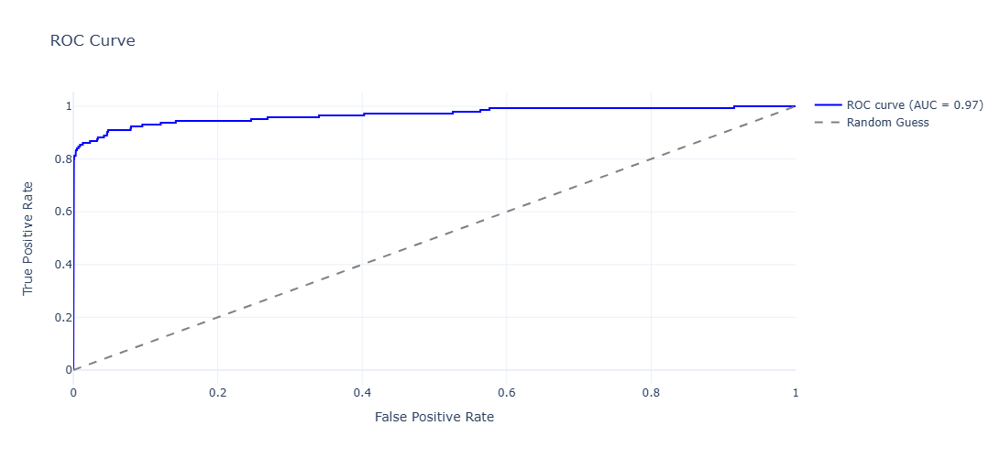

In [70]:
from sklearn.metrics import roc_curve, auc

import plotly.graph_objects as go
from sklearn.metrics import roc_curve, auc

y_pred_proba = modelx.predict_proba(x_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)

fig = go.Figure()


fig.add_trace(go.Scatter(
    x=fpr, y=tpr,
    mode='lines',
    name=f"ROC curve (AUC = {roc_auc:.2f})",
    line=dict(width=2, color='blue')
))


fig.add_trace(go.Scatter(
    x=[0, 1], y=[0, 1],
    mode='lines',
    name='Random Guess',
    line=dict(dash='dash', color='gray')
))


fig.update_layout(
    title="ROC Curve",
    xaxis_title="False Positive Rate",
    yaxis_title="True Positive Rate",
    template="plotly_white",
    width=700,
    height=500
)

fig.show()



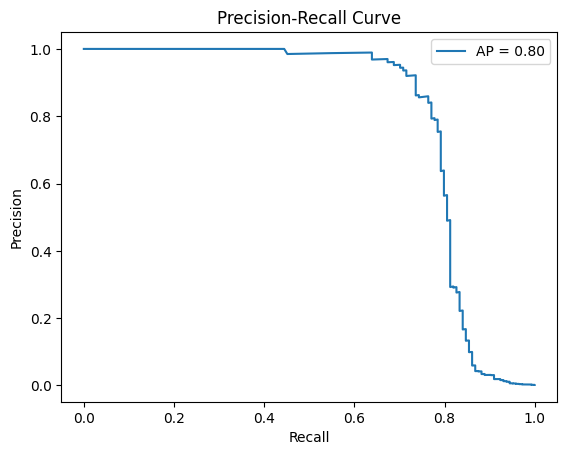

In [66]:
from sklearn.metrics import precision_recall_curve, average_precision_score

precision, recall, thresholds = precision_recall_curve(y_test, y_pred_proba)
ap = average_precision_score(y_test, y_pred_proba)

plt.plot(recall, precision, label=f"AP = {ap:.2f}")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve")
plt.legend()
plt.show()


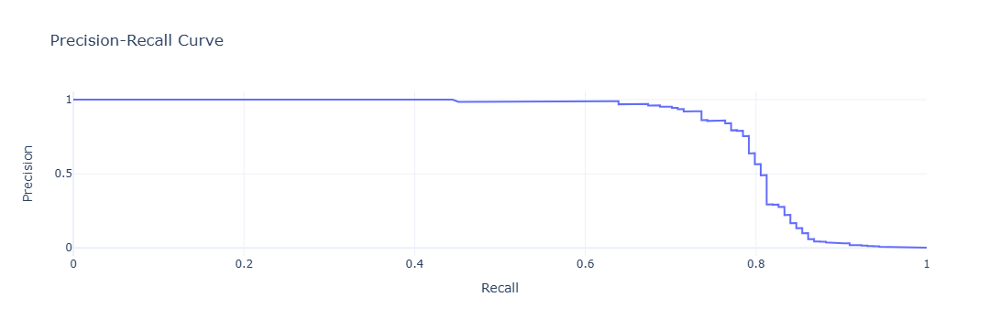

In [67]:
import plotly.graph_objects as go
from sklearn.metrics import precision_recall_curve, average_precision_score

# Precision-Recall values
precision, recall, thresholds = precision_recall_curve(y_test, y_pred_proba)
ap = average_precision_score(y_test, y_pred_proba)

# Create interactive plot
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=recall,
    y=precision,
    mode='lines',
    name=f'AP = {ap:.2f}',
    line=dict(width=2)
))

# Labels and layout
fig.update_layout(
    title="Precision-Recall Curve",
    xaxis_title="Recall",
    yaxis_title="Precision",
    template="plotly_white"
)

fig.show()


## Summary of Credit Card Fraud Detection Using Machine Learning

In this project, we developed and evaluated a machine learning model to detect fraudulent transactions in credit card data. The objective was to build a robust, accurate, and scalable system that minimizes false positives and effectively identifies fraudulent activities to help financial institutions reduce fraud-related losses and enhance customer trust.

* We utilized a publicly available credit card transaction dataset containing both fraudulent and legitimate transactions. The dataset was highly imbalanced, with fraudulent transactions constituting a small fraction of the total.
* Preprocessing steps included normalizing numerical features and balancing the dataset.
* We use under sampling to handle the large imbalance data and to secure similar distribution.
* Here we want to estimate the catagorical variable so we used just simple logistic regression model and XGBoost Classifier.
* Models were evaluated using key metrics such as Accuracy, Precision, Recall, Confusion matrix, Mathhews corr to assess their ability to differentiate between fraudulent and non-fraudulent transactions.
* The developed model is expected to significantly reduce the financial impact of fraud by accurately identifying suspicious transactions, enabling timely intervention by financial institutions.


## Conclusion

The project successfully demonstrated the effectiveness of machine learning models in detecting credit card fraud with high accuracy and robustness. Implementing this solution in real-world scenarios can provide substantial benefits, such as improved fraud detection rates, reduced false positives, and enhanced customer trust and experience. Continuous monitoring, regular updates, and adaptation to new fraud tactics will be essential to maintain and improve the model's performance over time.

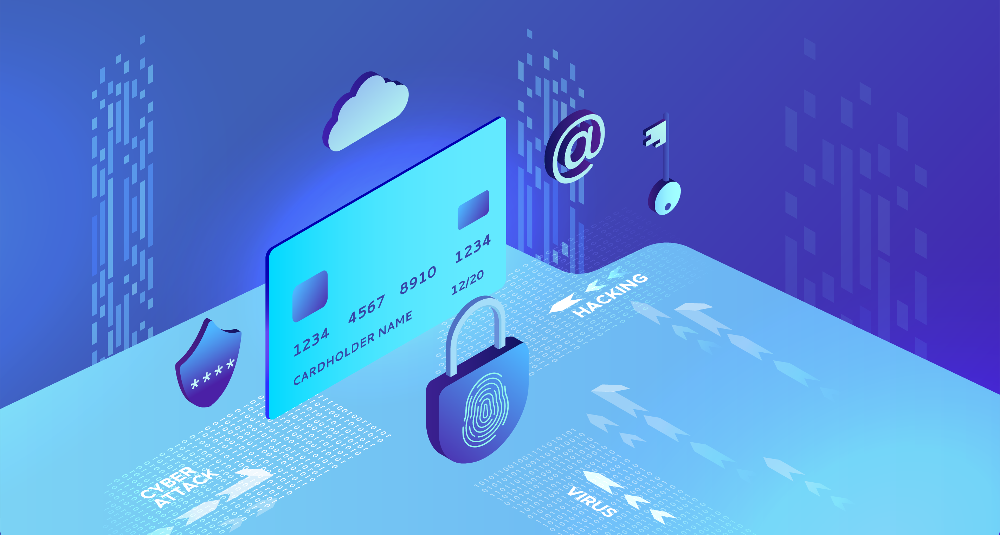